In [8]:
# !cp ./drive/MyDrive/best.pth . 
# !cp ./drive/MyDrive/new_best.pth . 
# !cp ./drive/MyDrive/kouame_best.pth . 

# Imports

In [9]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import matplotlib.patches as mpatches
import scipy.io
import tqdm
from tqdm.notebook import tqdm

In [10]:
color_ls = [f'C{i}' for i in range(10)]

## Model Architecture

### Inspired by the paper [Noise Reduction in ECG Signals Using Fully Convolutional Denoising Autoencoders](https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=8693790)

![archi autoencoder](imgs/archi_autoencoder.jpeg)



In [43]:
class DAE(nn.Module):

  def __init__(self, input_size=1024, kernel_size=16):
    super(DAE, self).__init__()

    self.activation = nn.ELU()
    self.kernel_size = kernel_size
    self.input_size = input_size
    self.padding = (kernel_size - 1) // 2

    slot = self.input_size

    self.conv1 = nn.Conv1d(1, 40, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn1 = nn.BatchNorm1d(40)
    self.conv2 = nn.Conv1d(40, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn2 = nn.BatchNorm1d(20)
    self.conv3 = nn.Conv1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn3 = nn.BatchNorm1d(20)
    self.conv4 = nn.Conv1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn4 = nn.BatchNorm1d(20)
    self.conv5 = nn.Conv1d(20, 40, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn5 = nn.BatchNorm1d(40)
    self.conv6 = nn.Conv1d(40, 1, self.kernel_size, stride=1, padding='same')
    self.deconv0 = nn.ConvTranspose1d(1, 1, self.kernel_size - 1, stride=1, padding=self.padding)
    self.deconv_bn0 = nn.BatchNorm1d(1)
    self.deconv1 = nn.ConvTranspose1d(1, 40, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn1 = nn.BatchNorm1d(40)
    self.deconv2 = nn.ConvTranspose1d(40, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn2 = nn.BatchNorm1d(20)
    self.deconv3 = nn.ConvTranspose1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn3 = nn.BatchNorm1d(20)
    self.deconv4 = nn.ConvTranspose1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn4 = nn.BatchNorm1d(20)
    self.deconv5 = nn.ConvTranspose1d(20, 40, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn5 = nn.BatchNorm1d(40)
    self.deconv6 = nn.ConvTranspose1d(
        40, 
        1, 
        self.kernel_size - 1, 
        stride=1, 
        padding=(self.kernel_size - 1) // 2
    )
    
  def forward(self, x):
    # encoder
    x = self.conv1(x)
    x = self.conv_bn1(x)
    x = self.activation(x)
    
    x = self.conv2(x)
    x = self.conv_bn2(x)
    x = self.activation(x)
    
    x = self.conv3(x)
    x = self.conv_bn3(x)
    x = self.activation(x)
    
    x = self.conv4(x)
    x = self.conv_bn4(x)
    x = self.activation(x)
    
    x = self.conv5(x)
    x = self.conv_bn5(x)
    x = self.activation(x)
    
    x = self.conv6(x)
    x = self.activation(x)

    # decoder
    x = self.deconv0(x)
    x = self.deconv_bn0(x)
    x = self.activation(x)

    x = self.deconv1(x)
    x = self.deconv_bn1(x)
    x = self.activation(x)
    
    x = self.deconv2(x)
    x = self.deconv_bn2(x)
    x = self.activation(x)
    
    x = self.deconv3(x)
    x = self.deconv_bn3(x)
    x = self.activation(x)
    
    x = self.deconv4(x)
    x = self.deconv_bn4(x)
    x = self.activation(x)
    
    x = self.deconv5(x)
    x = self.deconv_bn5(x)
    x = self.activation(x)
    
    x = self.deconv6(x)
    x = self.activation(x)

    return x

class DAE_PCG(nn.Module):

  def __init__(self, input_size=1024, kernel_size=16):
    super(DAE_PCG, self).__init__()

    self.activation = nn.ELU()
    self.kernel_size = kernel_size
    self.input_size = input_size
    self.padding = (kernel_size - 1) // 2

    slot = self.input_size

    self.conv1 = nn.Conv1d(1, 40, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn1 = nn.BatchNorm1d(40)
    self.conv2 = nn.Conv1d(40, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn2 = nn.BatchNorm1d(20)
    self.conv3 = nn.Conv1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn3 = nn.BatchNorm1d(20)
    self.conv4 = nn.Conv1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn4 = nn.BatchNorm1d(20)
    self.conv5 = nn.Conv1d(20, 40, self.kernel_size, stride=2, padding=self.padding)
    self.conv_bn5 = nn.BatchNorm1d(40)
    self.conv6 = nn.Conv1d(40, 1, self.kernel_size, stride=1, padding='same')
    self.deconv0 = nn.ConvTranspose1d(1, 1, self.kernel_size - 1, stride=1, padding=self.padding)
    self.deconv_bn0 = nn.BatchNorm1d(1)
    self.deconv1 = nn.ConvTranspose1d(1, 40, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn1 = nn.BatchNorm1d(40)
    self.deconv2 = nn.ConvTranspose1d(40, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn2 = nn.BatchNorm1d(20)
    self.deconv3 = nn.ConvTranspose1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn3 = nn.BatchNorm1d(20)
    self.deconv4 = nn.ConvTranspose1d(20, 20, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn4 = nn.BatchNorm1d(20)
    self.deconv5 = nn.ConvTranspose1d(20, 40, self.kernel_size, stride=2, padding=self.padding)
    self.deconv_bn5 = nn.BatchNorm1d(40)
    self.deconv6 = nn.ConvTranspose1d(
        40, 
        1, 
        self.kernel_size - 1, 
        stride=1, 
        padding=(self.kernel_size - 1) // 2
    )
    
  def forward(self, x):
    # encoder
    x = self.conv1(x)
    x = self.conv_bn1(x)
    x = self.activation(x)
    
    x = self.conv2(x)
    x = self.conv_bn2(x)
    x = self.activation(x)
    
    x = self.conv3(x)
    x = self.conv_bn3(x)
    x = self.activation(x)
    
    x = self.conv4(x)
    x = self.conv_bn4(x)
    x = self.activation(x)
    
    x = self.conv5(x)
    x = self.conv_bn5(x)
    x = self.activation(x)
    
    x = self.conv6(x)
    x = self.activation(x)

    # decoder
    x = self.deconv0(x)
    x = self.deconv_bn0(x)
    x = self.activation(x)

    x = self.deconv1(x)
    x = self.deconv_bn1(x)
    x = self.activation(x)
    
    x = self.deconv2(x)
    x = self.deconv_bn2(x)
    x = self.activation(x)
    
    x = self.deconv3(x)
    x = self.deconv_bn3(x)
    x = self.activation(x)
    
    x = self.deconv4(x)
    x = self.deconv_bn4(x)
    x = self.activation(x)
    
    x = self.deconv5(x)
    x = self.deconv_bn5(x)
    x = self.activation(x)
    
    x = self.deconv6(x)
    # x = self.activation(x)

    return x


# Helper functions

In [14]:
# read *.mat files
def read_data(filename):
  mat = scipy.io.loadmat(filename)
  return mat

# function that plots multiple signals
def plotme(*arrs, lg=None, colors=None, ax_t=None, figsize=(30,10)):
  if ax_t is None:
    ax_t = ['Amplitude', 'N of samples']
  if colors is None:
    colors = color_ls
  if lg is None:
    lg = []
  plt.figure(figsize=figsize)
  for i in range(len(arrs)):
    plt.plot(arrs[i], color=colors[i % len(colors)])

  patch_ls = []
  for i in range(len(lg)):
    patch = mpatches.Patch(
        color=colors[i % len(colors)], 
        label=lg[i],
    )
    patch_ls.append(patch)

  plt.legend(handles=patch_ls, prop={'size': 24})
  plt.ylabel(ax_t[0])
  plt.xlabel(ax_t[1])
  plt.show()

# Make a plot report that resembles the plots produced in the paper
def plot_report(clean, noisy, recons, output, lg =None, ax_t=None, figsize=(30,40)):
  fig, axes = plt.subplots(4, figsize=figsize)

  if ax_t is None:
    ax_t = ['Amplitude', 'N of Samples']
  if lg is None:
    lg = [
        'Clean Sig.',
        'Noisy Signal',
        'Org. Recons. Sig.',
        'Our Recons. Sig.',
    ]
  
  for i in range(len(axes)):
    axes[i].set_ylabel(ax_t[0])
    axes[i].set_xlabel(ax_t[1])
  
  axes[0].plot(clean, color='C0')
  axes[0].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[0],
          )
      ],
      prop={'size': 24},
  )
  axes[0].set_title('Clean Signal')
  
  axes[1].plot(noisy, color='C0')
  axes[1].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[1],
          )
      ],
      prop={'size': 24},
  )
  axes[1].set_title('Noisy Signal')
  
  axes[2].plot(clean, color='C0')
  axes[2].plot(recons, color='C3')
  axes[2].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[0],
          ),
          mpatches.Patch(
              color='C3', 
              label=lg[2],
          )
      ],
      prop={'size': 24},
  )
  axes[2].set_title('Clean & Original Reconstructed Signal')
  
  axes[3].plot(clean, color='C0')
  axes[3].plot(output, color='C3')
  axes[3].legend(
      handles=[
          mpatches.Patch(
              color='C0', 
              label=lg[0],
          ),
          mpatches.Patch(
              color='C3', 
              label=lg[3],
          )
      ],
      prop={'size': 24},
  )
  axes[3].set_title('Clean & Our Reconstructed Signal')

  plt.show()

# add noise to a signal based on SNR
def add_noise(signal, snr, torch=False):
    
    signal_power = (signal**2).mean()
    
    noise_power = signal_power / (10**(snr/10))
    
    if torch:
      noise = torch.tensor(np.random.normal(loc=0, scale=np.sqrt(noise_power), size=signal.shape))
    else:
      noise = np.random.normal(loc=0, scale=np.sqrt(noise_power), size=signal.shape)
    
    noisy_signal = signal + noise
    
    return noisy_signal

# Metrics Functions

In [15]:
# calculate SNR between a clean signal an a noisy signal
def calc_snr(x,y):
  return 10 * torch.log10((x**2).sum() / (((x - y) ** 2).sum() + 1e-9))

# calc_snr function adapted to batches to facilitate calculations during training
def calc_snr_batch(bx,by):
  return 10 * torch.log10((bx**2).sum(axis=-1)[:,0] / (((bx - by) ** 2).sum(axis=-1)[:,0] + 1e-9)).mean()

# calculate PRD score adapted for batches
def prd_batch(bx, by):
  return torch.sqrt(((((bx - by) ** 2).sum(axis=-1)[:,0]) / (bx ** 2).sum(axis=-1)[:,0]).mean()) * 100

# Training functions

In [16]:
def train_fn_base(model, train=None, valid=None, opt=None, loss_fn=None, epochs=10):
  model.train()
  
  best_val_loss = 10e9

  for epoch in range(1, epochs + 1):
    loss_g = 0
    v_loss_g = 0
    v_loss_r = 0
    for _, batch in tqdm(enumerate(train, 0), unit="batch", total=len(train)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)

      out = model(noisy)

      loss = loss_fn(out, clean)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_g += loss.item()

    model.eval()
    for _, batch in tqdm(enumerate(valid, 0), unit="batch", total=len(valid)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)
      
      out = model(noisy)

      loss = loss_fn(out, clean)
      loss_r = loss_fn(batch['clean'], batch['recons'])
      v_loss_g += loss.item()
      v_loss_r += loss_r.item()
    model.train()

    v_loss_mean = v_loss_g / len(valid)

    print(f'epoch {epoch}:')
    print(f'MSE training loss: {loss_g / len(train)}')
    print(f'MSE validation loss: {v_loss_mean}')
    print(f'MSE reconstruc loss: {v_loss_r / len(valid)}')


    if v_loss_mean < best_val_loss:
      print('found better valid loss... saving model...')
      torch.save(model.state_dict(), 'best.pth')
      best_val_loss = v_loss_mean
  
def train_fn_plus(model, train=None, valid=None, opt=None, loss_fn=None, epochs=10):
  model.train()
  
  best_val_loss = 10e9

  train_loss_vec = []
  val_loss_vec = []
  rmse_loss_vec = []
  prd_vec = []
  snr_imp_vec = []

  for epoch in range(1, epochs + 1):
    loss_g = 0
    v_loss_g = 0

    rmse_loss_g = 0
    prd_g = 0
    snr_imp_g = 0

    for _, batch in tqdm(enumerate(train, 0), unit="batch", total=len(train)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)

      out = model(noisy)

      loss = loss_fn(out, clean)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_g += loss.item()

    model.eval()
    for _, batch in tqdm(enumerate(valid, 0), unit="batch", total=len(valid)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)
      
      out = model(noisy)

      loss = loss_fn(out, clean)
      
      v_loss_g += loss.item()
      rmse_loss_g += torch.sqrt(loss).item()
      prd_g += prd_batch(clean, out).item()
      
      snr_in = calc_snr_batch(clean, noisy).item()
      snr_out = calc_snr_batch(clean, out).item()

      snr_imp_g += snr_out - snr_in

    model.train()

    t_loss_mean = loss_g / len(train)
    v_loss_mean = v_loss_g / len(valid)
    

    print(f'epoch {epoch}:')
    print(f'MSE training loss: {t_loss_mean}')
    print(f'MSE validation loss: {v_loss_mean}')

    train_loss_vec.append(t_loss_mean)
    val_loss_vec.append(v_loss_mean)

    rmse_loss_vec.append(rmse_loss_g / len(valid))
    prd_vec.append(prd_g / len(valid))
    snr_imp_vec.append(snr_imp_g / len(valid))


    if v_loss_mean < best_val_loss:
      print('found better valid loss... saving model...')
      torch.save(model.state_dict(), 'new_best.pth')
      best_val_loss = v_loss_mean

  return {
      'train_loss': train_loss_vec,
      'val_loss': val_loss_vec,
      'rmse_loss': rmse_loss_vec,
      'prd': prd_vec,
      'snr_imp': snr_imp_vec,
  }

def train_fn_kouame(model, train=None, valid=None, opt=None, loss_fn=None, epochs=10):
  model.train()
  
  best_val_loss = 10e9

  train_loss_vec = []
  val_loss_vec = []
  rmse_loss_vec = []
  prd_vec = []
  snr_imp_vec = []

  for epoch in range(1, epochs + 1):
    loss_g = 0
    v_loss_g = 0

    rmse_loss_g = 0
    prd_g = 0
    snr_imp_g = 0

    for _, batch in tqdm(enumerate(train, 0), unit="batch", total=len(train)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)

      out = model(noisy)

      loss = loss_fn(out, clean)
      optimizer.zero_grad()
      loss.backward()
      optimizer.step()

      loss_g += loss.item()

    model.eval()
    for _, batch in tqdm(enumerate(valid, 0), unit="batch", total=len(valid)):
      clean = batch['clean']
      clean = clean.to(device)

      noisy = batch['noisy'].clone()
      noisy.requires_grad = True
      noisy = noisy.to(device)
      
      out = model(noisy)

      loss = loss_fn(out, clean)
      
      v_loss_g += loss.item()
      rmse_loss_g += torch.sqrt(loss).item()
      prd_g += prd_batch(clean, out).item()
      
      snr_in = calc_snr_batch(clean, noisy).item()
      snr_out = calc_snr_batch(clean, out).item()

      snr_imp_g += snr_out - snr_in

    model.train()

    t_loss_mean = loss_g / len(train)
    v_loss_mean = v_loss_g / len(valid)

    print(f'epoch {epoch}:')
    print(f'MSE training loss: {t_loss_mean}')
    print(f'MSE validation loss: {v_loss_mean}')

    train_loss_vec.append(t_loss_mean)
    val_loss_vec.append(v_loss_mean)

    rmse_loss_vec.append(rmse_loss_g / len(valid))
    prd_vec.append(prd_g / len(valid))
    snr_imp_vec.append(snr_imp_g / len(valid))


    if v_loss_mean < best_val_loss:
      print('found better valid loss... saving model...')
      torch.save(model.state_dict(), 'kouame_best.pth')
      best_val_loss = v_loss_mean

  return {
      'train_loss': train_loss_vec,
      'val_loss': val_loss_vec,
      'rmse_loss': rmse_loss_vec,
      'prd': prd_vec,
      'snr_imp': snr_imp_vec,
  }

# Dataset Classes

In [17]:
class SignalsDataset(Dataset):
    def __init__(self, d):
      self.clean = torch.tensor(d['clean'], dtype=torch.float32).unsqueeze(1)
      self.origin = torch.tensor(d['origin'], dtype=torch.float32).unsqueeze(1)
      self.recons = torch.tensor(d['recons'], dtype=torch.float32).unsqueeze(1)

    def __len__(self):
      return len(self.clean)

    def __getitem__(self, idx):
      noisy = self.origin[idx]
      clean = self.clean[idx]
      recons = self.recons[idx]
      return {
          'noisy': noisy,
          'clean': clean,
          'recons': recons,
      }

class OurSignalsDataset(Dataset):
    def __init__(self, d, snr_list=None):

      self.snr_list = snr_list

      self.clean = torch.tensor(
          d['clean'], 
          dtype=torch.float32
      ).expand(
          len(snr_list),
          d['clean'].shape[0],
          d['clean'].shape[1],
      ).permute([1,0,2]).flatten(
          start_dim=0,
          end_dim=1,
      ).unsqueeze(1)

      self.noisy = torch.tensor(d['noisy'], dtype=torch.float32).flatten(
          start_dim=0,
          end_dim=1,
      ).unsqueeze(1)

      npsnr = np.array(self.snr_list)

      self.snr_mat = np.ones((d['noisy'].shape[0], d['noisy'].shape[1]))
      self.snr_mat *= npsnr
      self.snr_mat = torch.tensor(self.snr_mat, dtype=torch.float16).flatten(
          start_dim=0,
          end_dim=1,
      ).unsqueeze(1)

    def __len__(self):
      return len(self.noisy)

    def __getitem__(self, idx):
      noisy = self.noisy[idx]
      clean = self.clean[idx]
      snrs = self.snr_mat[idx]
      return {
          'noisy': noisy,
          'clean': clean,
          'SNR': snrs,
      }

class KouameDataset(Dataset):
    def __init__(self, d):
      self.clean = torch.tensor(d['clean'], dtype=torch.float32).unsqueeze(1)
      self.noisy = torch.tensor(d['noisy'], dtype=torch.float32).unsqueeze(1)

    def __len__(self):
      return len(self.clean)

    def __getitem__(self, idx):
      clean = self.clean[idx]
      noisy = self.noisy[idx]
      return {
          'clean': clean,
          'noisy': noisy,
      }

In [18]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

cuda


## Training with available noisy/clean data in repo: [Noise-Reduction-in-ECG-Signals](https://github.com/sophie091524/Noise-Reduction-in-ECG-Signals)

In [19]:
clean = read_data('exp_data/clean.mat')['ecg']
origin = read_data('exp_data/origin.mat')['ecg']
recons = read_data('exp_data/recons.mat')['ecg']

A sample (blue) ECG signal with its noisy (red) counterpart

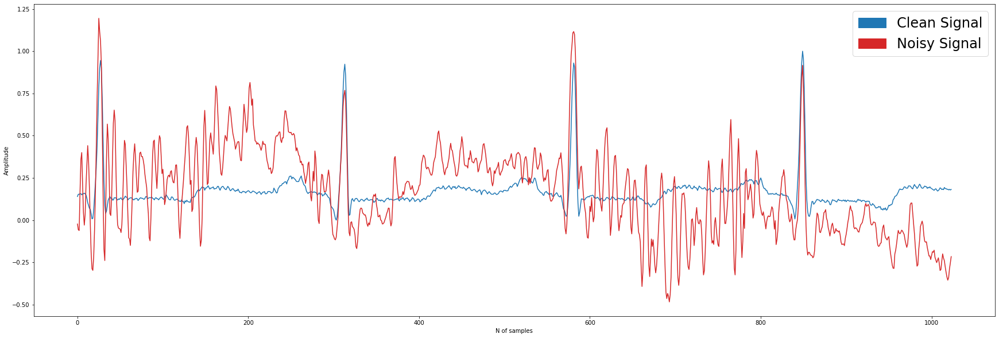

In [ ]:
plotme(clean[10], origin[10], lg=['Clean Signal', 'Noisy Signal'], colors=['C0', 'C3'], ax_t=['Amplitude', 'N of samples'])

Dataset Train/Validation/Test split

In [20]:
test_samples = 300
test = {
    'clean': clean[-test_samples:],
    'origin': origin[-test_samples:],
    'recons': recons[-test_samples:],
}

val_samples = 300
val = {
    'clean': clean[-(test_samples + val_samples):-test_samples],
    'origin': origin[-(test_samples + val_samples):-test_samples],
    'recons': recons[-(test_samples + val_samples):-test_samples],
}

train = {
    'clean': clean[:-(test_samples + val_samples)],
    'origin': origin[:-(test_samples + val_samples)],
    'recons': recons[:-(test_samples + val_samples)],
}


Plotting a hundred signals at once just for fun

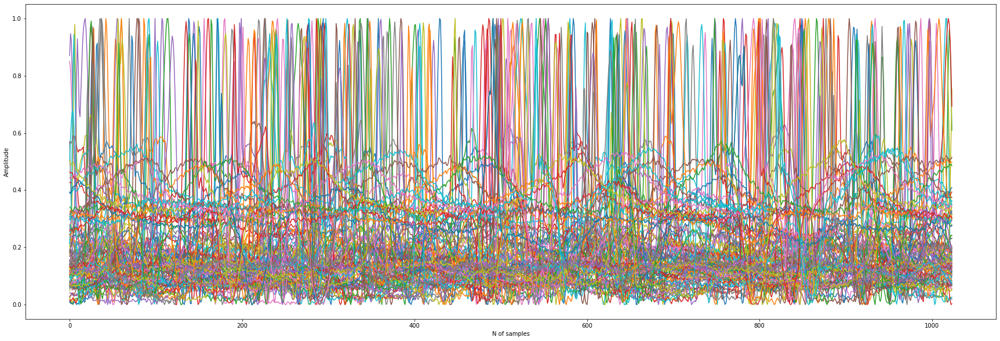

In [ ]:
colors = [f'C{i}' for i in range(10)]

plt.figure(figsize=(30,10))
for i in range(100):
  plt.plot(train['clean'][i], color=colors[i % len(colors)])
plt.xlabel('N of samples')
plt.ylabel('Amplitude')
plt.show()

In [ ]:
train['clean'].shape, val['clean'].shape, test['clean'].shape

((2280, 1024), (300, 1024), (300, 1024))

In [22]:
model = DAE()

lr = 5e-3
batch_size = 32
loss_fn = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=lr)

In [23]:
train_ds = SignalsDataset(train)
dl_train = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ds = SignalsDataset(val)
dl_val = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_ds = SignalsDataset(test)
dl_test = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [ ]:
model = model.to(device)

In [ ]:
train_fn_base(model, train=dl_train, valid=dl_val, opt=optimizer, loss_fn=loss_fn, epochs=100)

In [24]:
best_model = DAE()
best_model.load_state_dict(torch.load('best.pth'))
best_model.eval()
best_model = best_model.to(device)

In [25]:
out_full = best_model(train_ds[:]['noisy'].to(device)).detach().cpu()
out_full.shape

/usr/local/lib/python3.9/dist-packages/torch/nn/modules/conv.py:309: UserWarning: Using padding='same' with even kernel lengths and odd dilation may require a zero-padded copy of the input be created (Triggered internally at ../aten/src/ATen/native/Convolution.cpp:895.)
  return F.conv1d(input, weight, bias, self.stride,


torch.Size([2280, 1, 1024])

In [26]:
score = ((train_ds[:]['clean'] - out_full) ** 2).mean(axis=-1)[:,0]

In [27]:
score.argsort()

tensor([2218, 1945, 1519,  ..., 1531, 1807,  847])

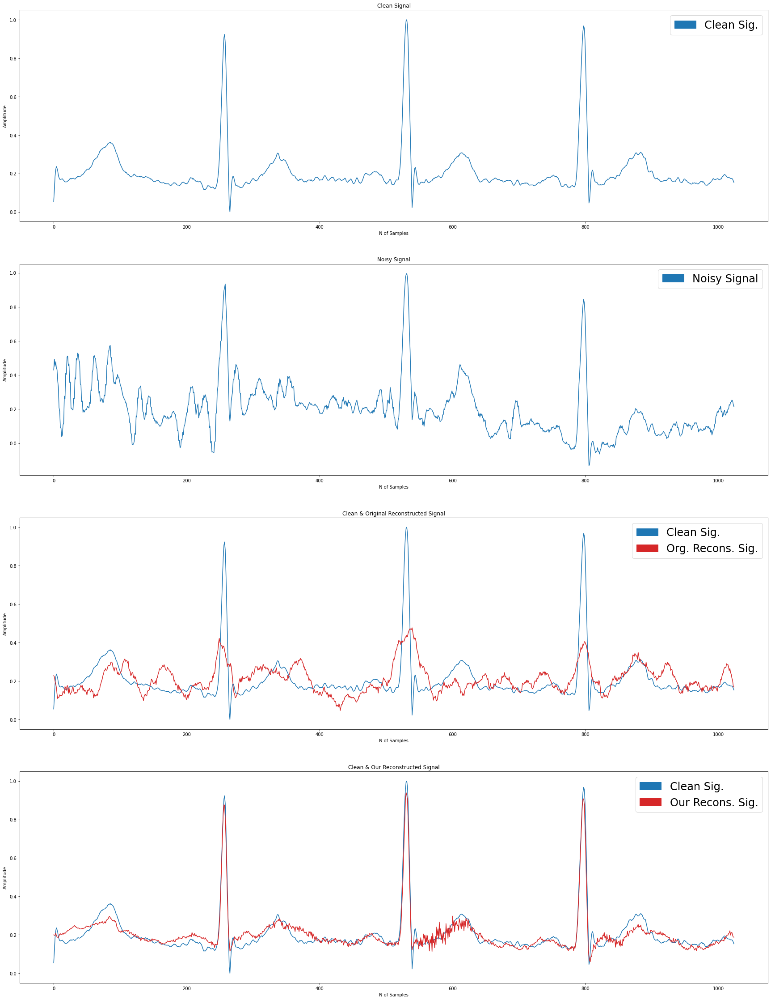

In [ ]:
index = 2230
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_recon, output)

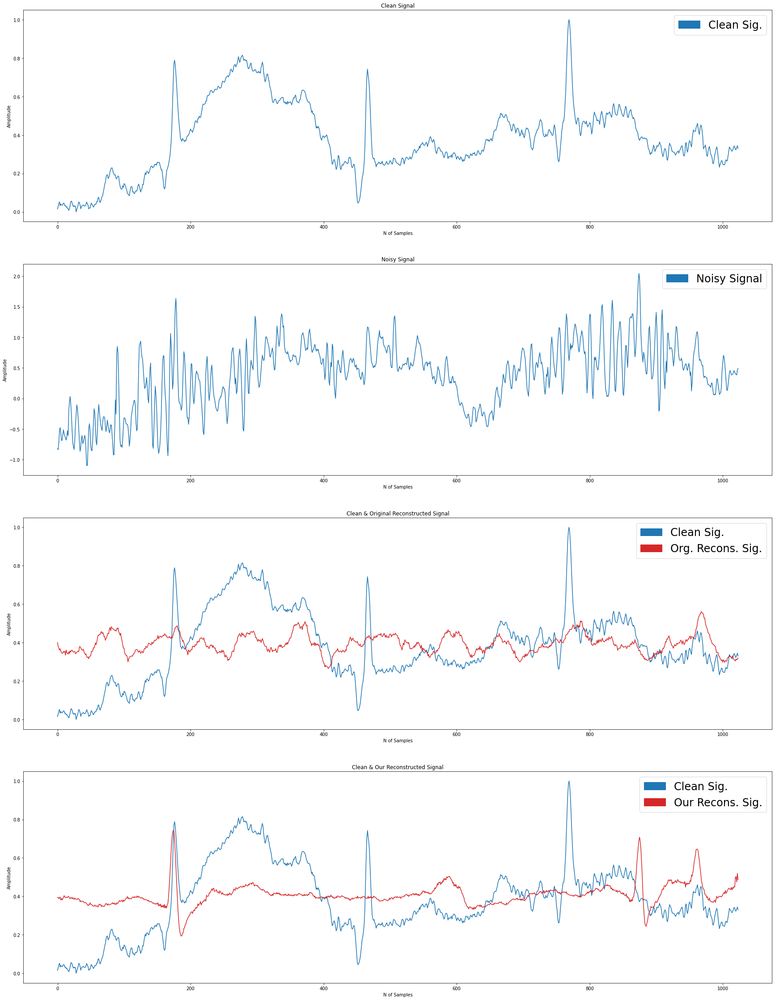

In [ ]:
index = 847
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_recon, output)

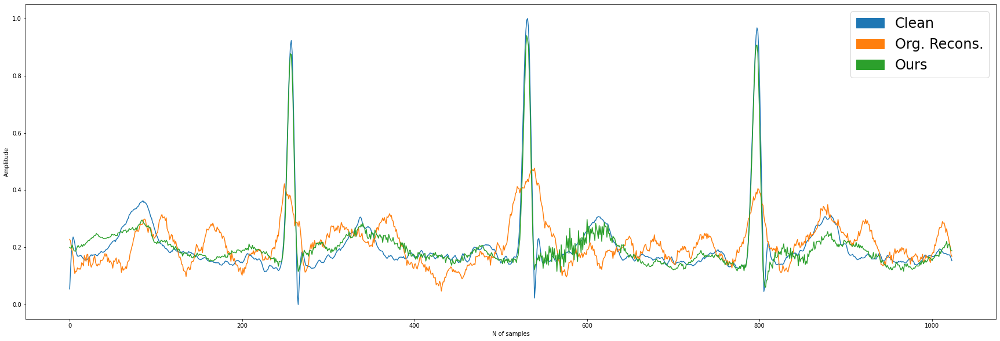

In [ ]:
index = 2230

sample = train_ds[index]
s_clean = sample['clean'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]

plotme(s_clean, s_recon, output, lg=['Clean', 'Org. Recons.', 'Ours'], colors=['C0', 'C1', 'C2'])

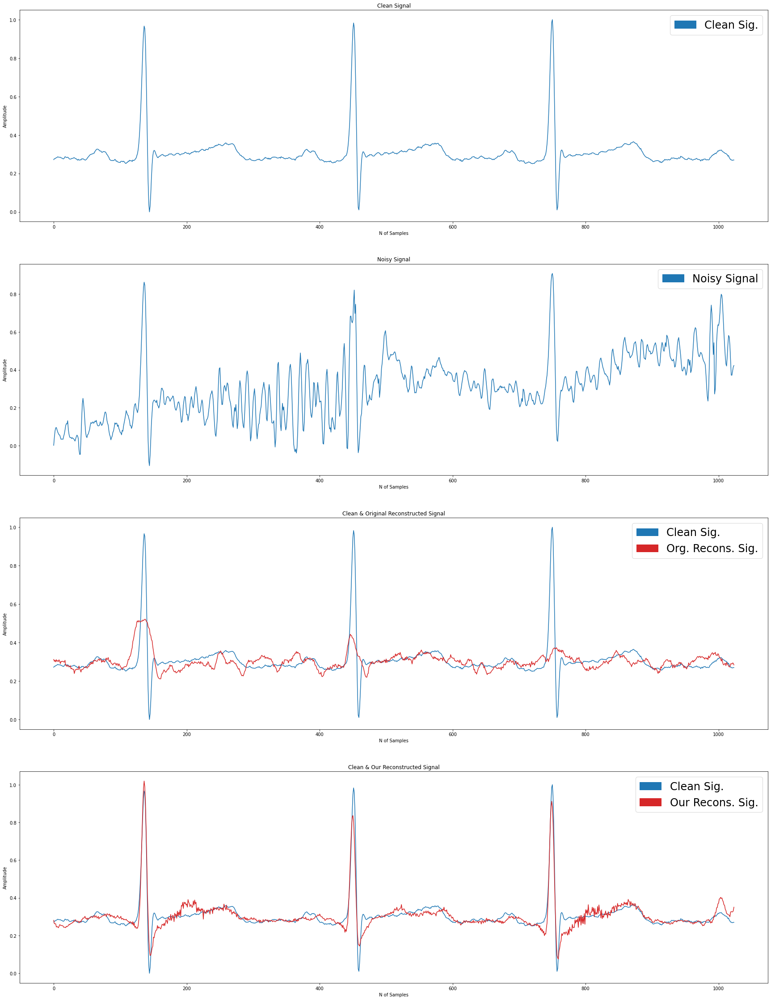

In [ ]:
index = 2218
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
s_recon = sample['recons'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_recon, output)

# Training with our SNR based generated signals

In [ ]:
from itertools import product

SNRs = [-2.5, -1, 0, 2.5, 3, 5, 7, 7.5]

my_clean = read_data('exp_data/clean.mat')['ecg']

noisy = [[add_noise(my_clean[i], snr) for snr in SNRs] for i in range(my_clean.shape[0])]

In [ ]:
noisy_arr = np.array(noisy)

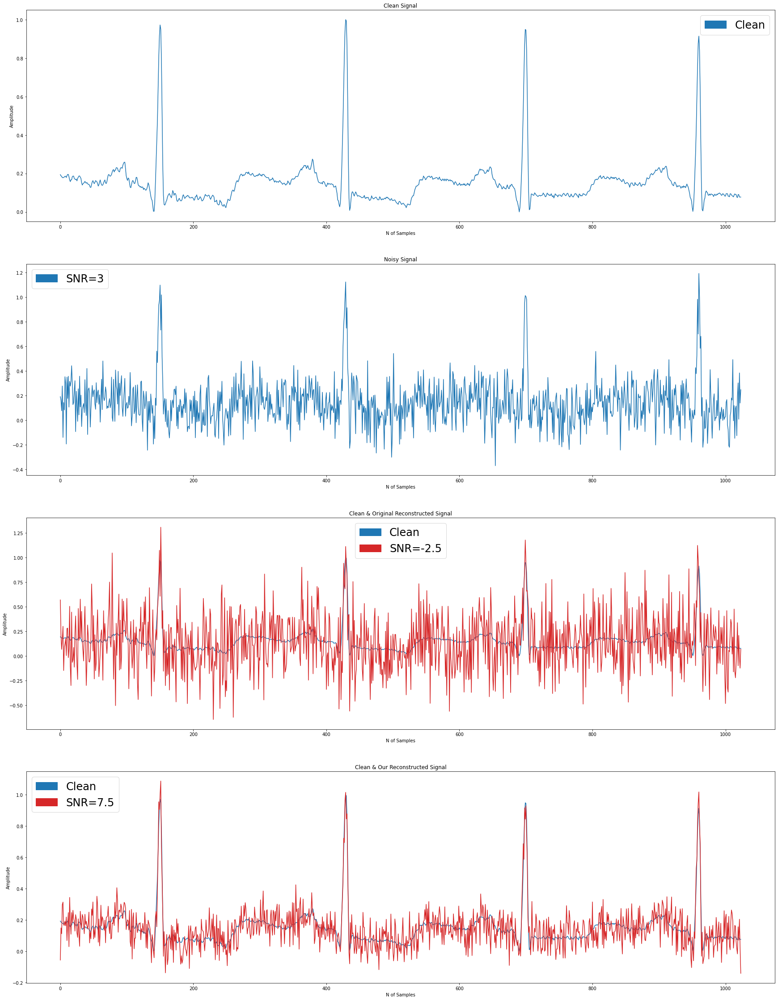

In [ ]:
plot_report(
    my_clean[0], 
    noisy_arr[0][4], 
    noisy_arr[0][0], 
    noisy_arr[0][-1], 
    lg=[
        'Clean',
        'SNR=3',
        'SNR=-2.5',
        'SNR=7.5',
    ]
)

In [ ]:
split = 300

dd_train = {
    'clean': my_clean[:-split-split],
    'noisy': noisy_arr[:-split-split],
}

dd_val = {
    'clean': my_clean[-split-split:-split],
    'noisy': noisy_arr[-split-split:-split],
}

dd_test = {
    'clean': my_clean[-split:],
    'noisy': noisy_arr[-split:],
}

In [ ]:
new_model = DAE()

lr = 5e-3
batch_size = 32
loss_fn = nn.MSELoss()
optimizer = optim.Adam(new_model.parameters(), lr=lr)

In [ ]:
train_ds = OurSignalsDataset(dd_train, SNRs)
dl_train = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ds = OurSignalsDataset(dd_val, SNRs)
dl_val = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_ds = OurSignalsDataset(dd_test, SNRs)
dl_test = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [ ]:
new_model = new_model.to(device)

In [ ]:
report = train_fn_plus(new_model, train=dl_train, valid=dl_val, opt=optimizer, loss_fn=loss_fn, epochs=20)

In [ ]:
new_model_saved = DAE()
new_model_saved.load_state_dict(torch.load('new_best.pth'))
new_model_saved.eval()
new_model_saved = new_model_saved.to(device)

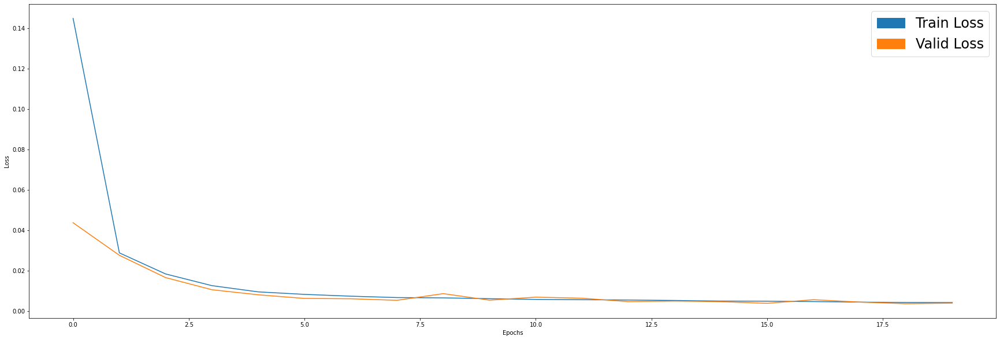

In [ ]:
plotme(report['train_loss'], report['val_loss'], ax_t=['Loss', 'Epochs'], colors=['C0', 'C1'], lg=['Train Loss', 'Valid Loss'])

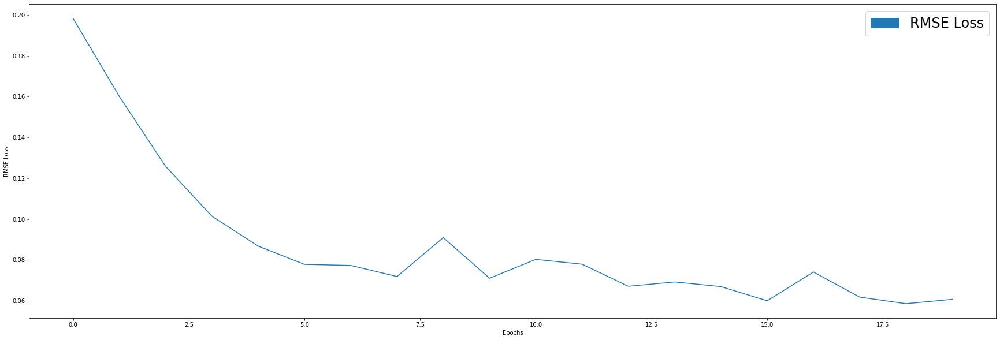

In [ ]:
plotme(report['rmse_loss'], ax_t=['RMSE Loss', 'Epochs'], colors=['C0'], lg=['RMSE Loss'])

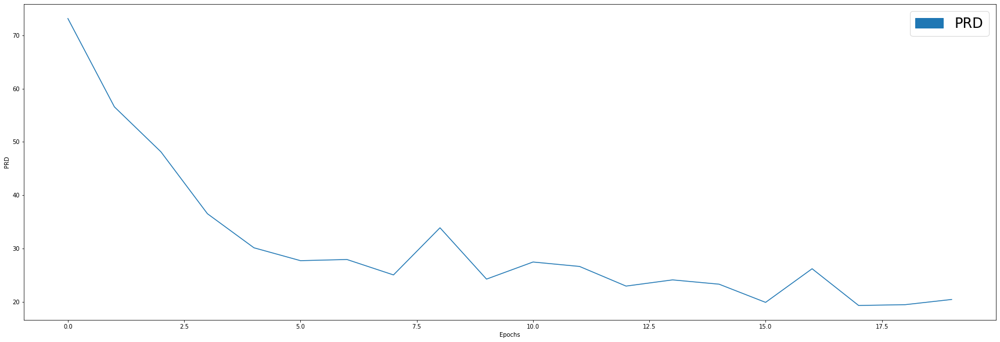

In [ ]:
plotme(report['prd'], ax_t=['PRD', 'Epochs'], colors=['C0'], lg=['PRD'])

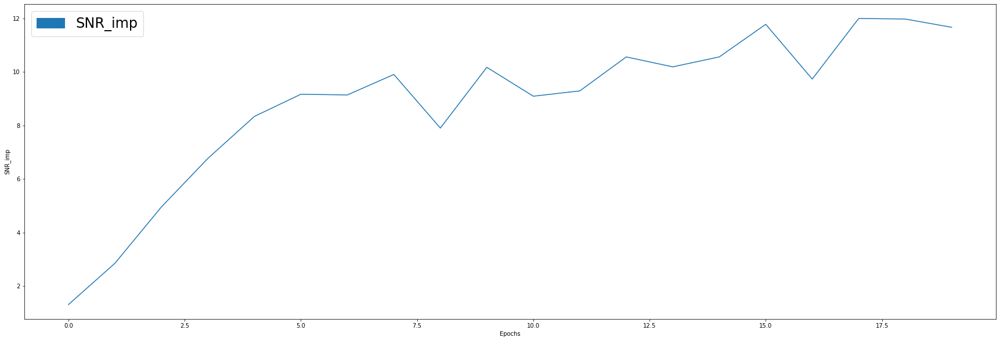

In [ ]:
plotme(report['snr_imp'], ax_t=['SNR_imp', 'Epochs'], colors=['C0'], lg=['SNR_imp'])

In [ ]:
dd_train['clean'].shape, dd_train['noisy'].shape 

((2280, 1024), (2280, 8, 1024))

In [ ]:
clean_perm, noisy_perm = torch.tensor(dd_train['clean']), torch.tensor(dd_train['noisy']).permute([1,0,2])
clean_perm, noisy_perm = clean_perm.unsqueeze(1), noisy_perm.unsqueeze(2)
clean_perm.shape, noisy_perm.shape

(torch.Size([2280, 1, 1024]), torch.Size([8, 2280, 1, 1024]))

In [ ]:
noisy_perm[0,:,0,:].shape

torch.Size([2280, 1024])

In [ ]:
snr_res = {}
for i in range(len(SNRs)):
  output = new_model_saved(torch.tensor(noisy_perm[i], dtype=torch.float32).to(device)).detach().cpu()

  snr_in = calc_snr_batch(clean_perm, noisy_perm[i])
  snr_out = calc_snr_batch(clean_perm, output)

  snr_imp = snr_out - snr_in

  snr_res[str(SNRs[i])] = snr_imp.item()

snr_res

<ipython-input-38-2d92004335cc>:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  output = new_model_saved(torch.tensor(noisy_perm[i], dtype=torch.float32).to(device)).detach().cpu()


{'-2.5': 15.35752204972891,
 '-1': 14.695428931454703,
 '0': 14.196215620674646,
 '2.5': 12.763890908454076,
 '3': 12.40752981318512,
 '5': 10.953768485358374,
 '7': 9.293191990586386,
 '7.5': 8.874830368340866}

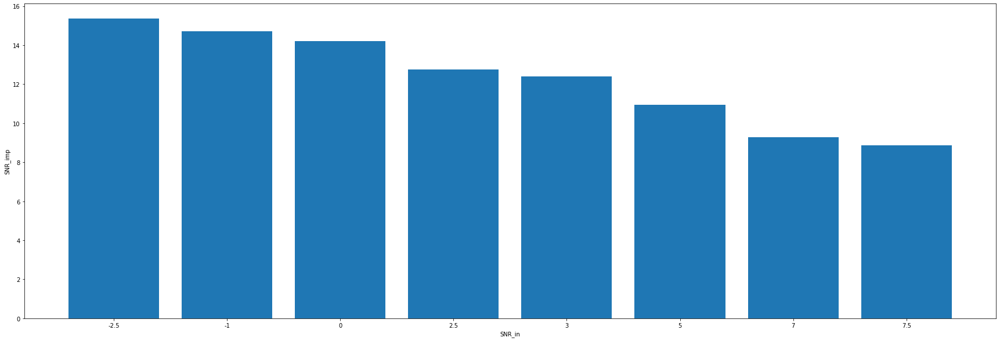

In [ ]:
plt.figure(figsize=(30,10))
plt.bar(list(snr_res.keys()), list(snr_res.values()))
plt.xlabel('SNR_in')
plt.ylabel('SNR_imp')
plt.show()

In [ ]:
s_noisy.to(device).unsqueeze(0).shape

torch.Size([1, 1024])

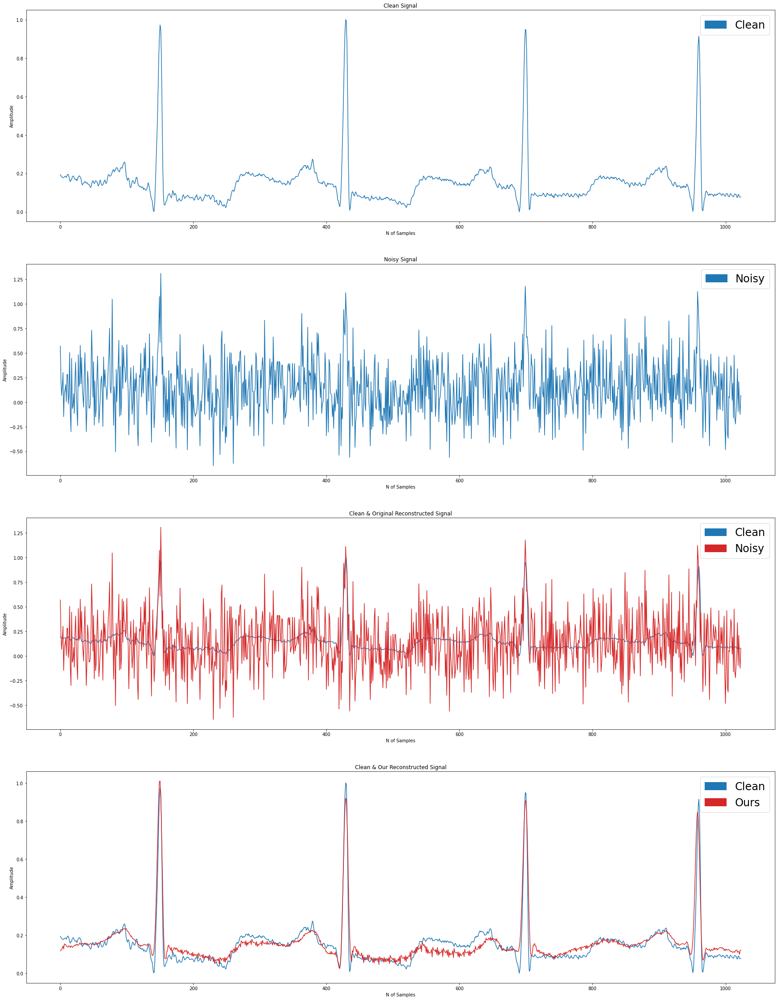

In [ ]:
index = 0
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = new_model_saved(s_noisy.to(device).unsqueeze(0).unsqueeze(0))[0][0].detach().cpu()
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

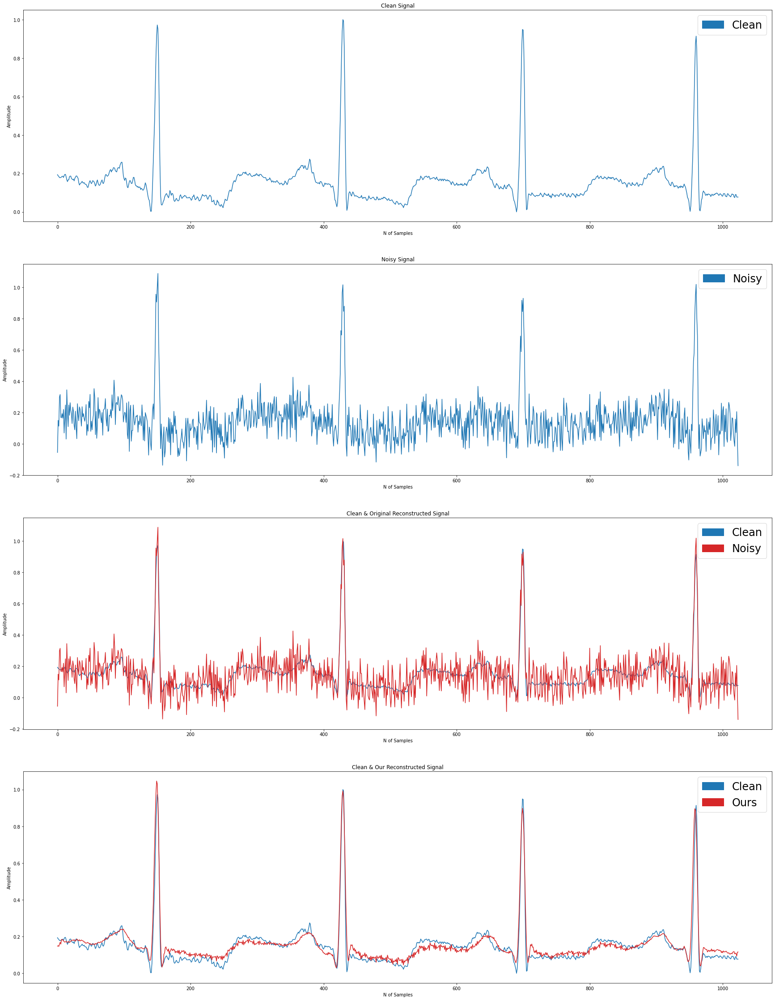

In [ ]:
index = 7
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = new_model_saved(s_noisy.to(device).unsqueeze(0).unsqueeze(0))[0][0].detach().cpu()
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

# KOUAME DATASET

In [31]:
clean1 = read_data('PCG/S1_Clean.mat')['PCG']
clean2 = read_data('PCG/S2_Clean.mat')['PCG']
clean3 = read_data('PCG/S3_Clean.mat')['PCG']

noisy1 = read_data('PCG/S1.mat')['x']
noisy2 = read_data('PCG/S2.mat')['x']
noisy3 = read_data('PCG/S3.mat')['x']

In [32]:
clean1.shape, clean2.shape, clean3.shape

((60151, 1), (45001, 1), (12801, 1))

In [33]:
noisy1.shape, noisy2.shape, noisy3.shape

((60000, 1), (45000, 1), (12000, 1))

In [34]:
clean1 = clean1[:50000]
clean2 = clean2[:40000]
clean3 = clean3[:10000]

noisy1 = noisy1[:50000]
noisy2 = noisy2[:40000]
noisy3 = noisy3[:10000]

In [35]:
clean = np.concatenate([clean1, clean2, clean3])
noisy = np.concatenate([noisy1, noisy2, noisy3])
clean.shape, noisy.shape

((100000, 1), (100000, 1))

In [36]:
ds_dict = {
    'clean': clean,
    'noisy': noisy,
}

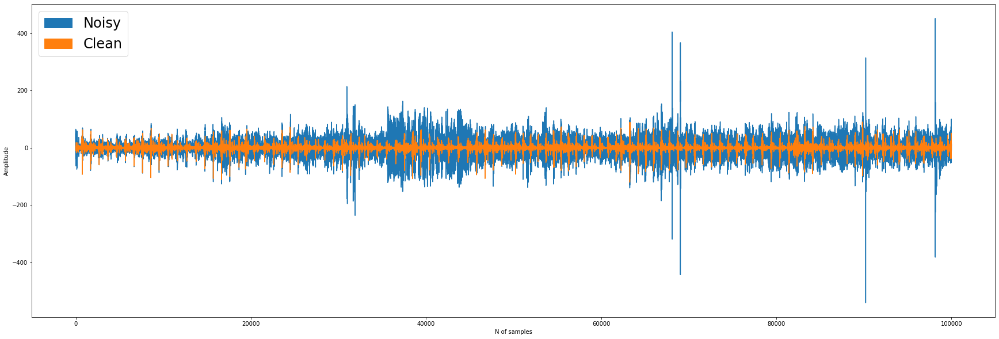

In [37]:
plotme(ds_dict['noisy'], ds_dict['clean'], lg=['Noisy', 'Clean'])

In [38]:
ds_dict['clean'] = ds_dict['clean'] / ds_dict['clean'].std()
ds_dict['noisy'] = ds_dict['noisy'] / ds_dict['noisy'].std()

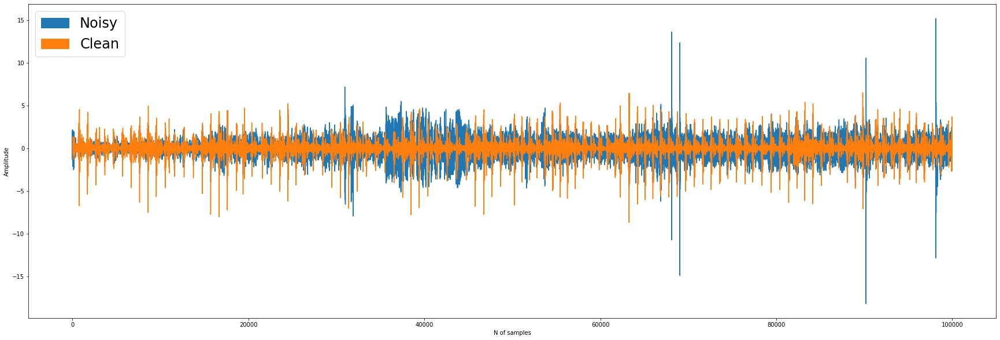

In [39]:
plotme(ds_dict['noisy'], ds_dict['clean'], lg=['Noisy', 'Clean'])

In [40]:
indexer = np.arange(1024)[None, :] + 32*np.arange(3000)[:, None]
clean_indexed = ds_dict['clean'][indexer][:,:,0]
noisy_indexed = ds_dict['noisy'][indexer][:,:,0]

In [44]:
kouame_model = DAE_PCG()

lr = 5e-3
batch_size = 32
loss_fn = nn.MSELoss()
optimizer = optim.Adam(kouame_model.parameters(), lr=lr)

In [42]:
clean_indexed.shape

(3000, 1024)

In [45]:
split = 300

dd_train = {
    'clean': clean_indexed[:-split-split],
    'noisy': noisy_indexed[:-split-split],
}

dd_val = {
    'clean': clean_indexed[-split-split:-split],
    'noisy': noisy_indexed[-split-split:-split],
}

dd_test = {
    'clean': clean_indexed[-split:],
    'noisy': noisy_indexed[-split:],
}

In [46]:
train_ds = KouameDataset(dd_train)
dl_train = DataLoader(train_ds, batch_size=batch_size, shuffle=True)
val_ds = KouameDataset(dd_val)
dl_val = DataLoader(val_ds, batch_size=batch_size, shuffle=False)
test_ds = KouameDataset(dd_test)
dl_test = DataLoader(test_ds, batch_size=batch_size, shuffle=False)

In [47]:
kouame_model = kouame_model.to(device)

In [ ]:
kouame_report = train_fn_kouame(kouame_model, train=dl_train, valid=dl_val, opt=optimizer, loss_fn=loss_fn, epochs=100)

In [49]:
kouame_model_saved = DAE_PCG()
kouame_model_saved.load_state_dict(torch.load('kouame_best.pth'))
kouame_model_saved.eval()
kouame_model_saved = kouame_model_saved.to(device)

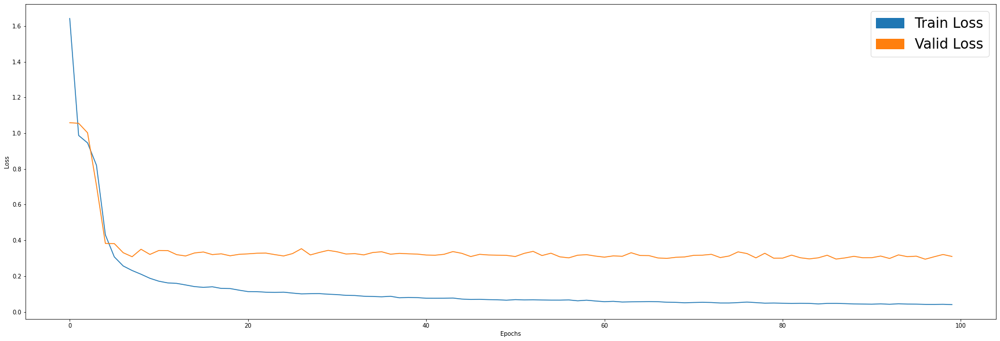

In [50]:
plotme(kouame_report['train_loss'], kouame_report['val_loss'], ax_t=['Loss', 'Epochs'], colors=['C0', 'C1'], lg=['Train Loss', 'Valid Loss'])

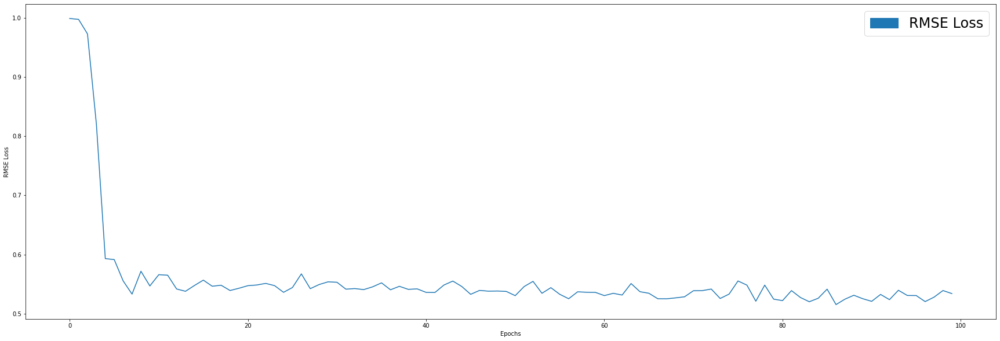

In [51]:
plotme(kouame_report['rmse_loss'], ax_t=['RMSE Loss', 'Epochs'], colors=['C0'], lg=['RMSE Loss'])

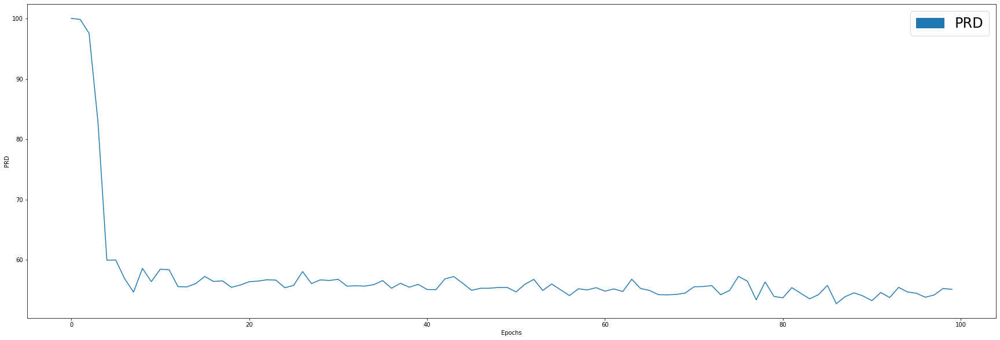

In [52]:
plotme(kouame_report['prd'], ax_t=['PRD', 'Epochs'], colors=['C0'], lg=['PRD'])

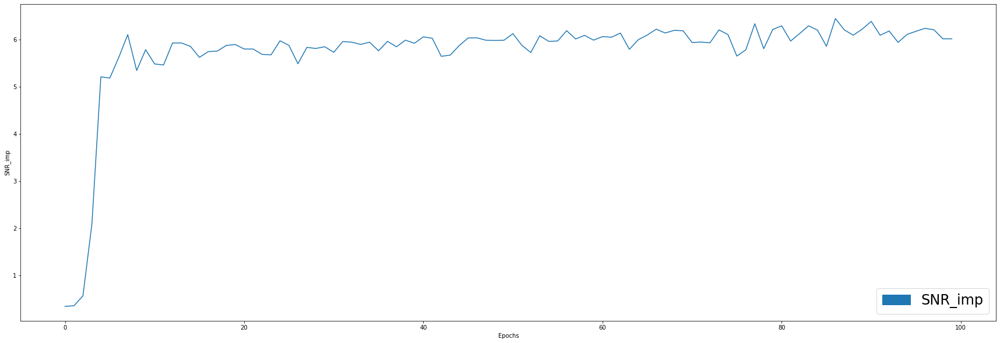

In [53]:
plotme(kouame_report['snr_imp'], ax_t=['SNR_imp', 'Epochs'], colors=['C0'], lg=['SNR_imp'])

In [54]:
out_full = kouame_model_saved(train_ds[:]['noisy'].to(device)).detach().cpu()
out_full.shape

torch.Size([2400, 1, 1024])

In [55]:
score = ((train_ds[:]['clean'] - out_full) ** 2).mean(axis=-1)[:,0]

In [56]:
score.argsort()

tensor([2231, 1065, 1859,  ..., 1170,  312, 1265])

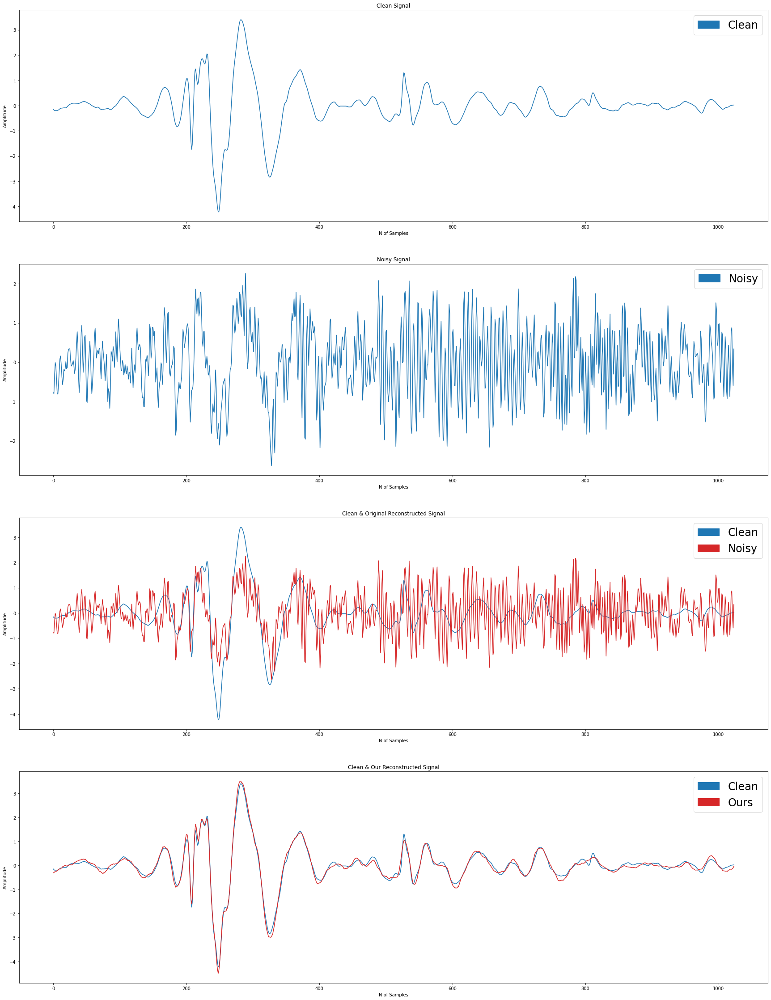

In [57]:
index = 2231
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

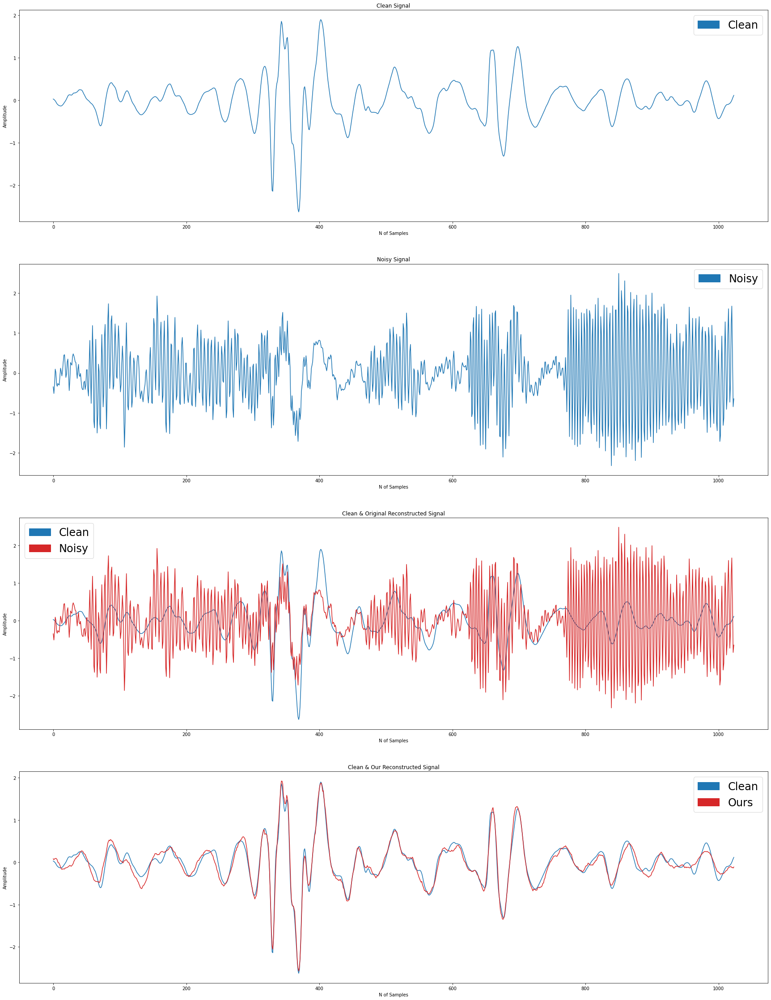

In [58]:
index = 1065
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

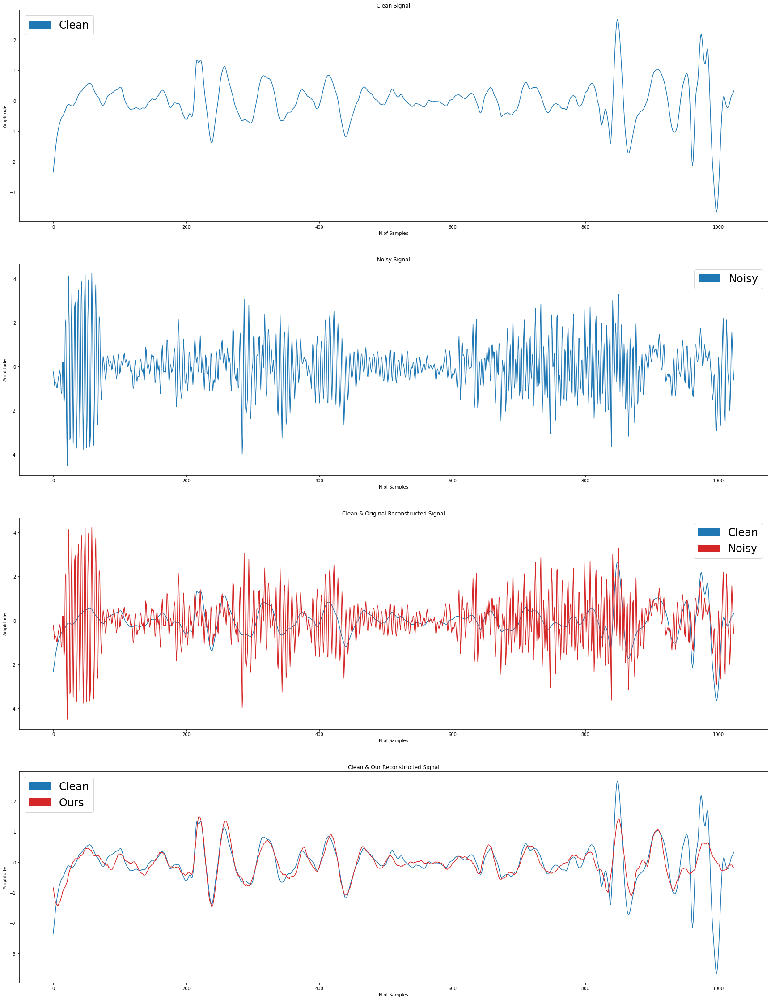

In [59]:
index = 1265
sample = train_ds[index]
s_clean = sample['clean'][0]
s_noisy = sample['noisy'][0]
output = out_full[index][0]
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])

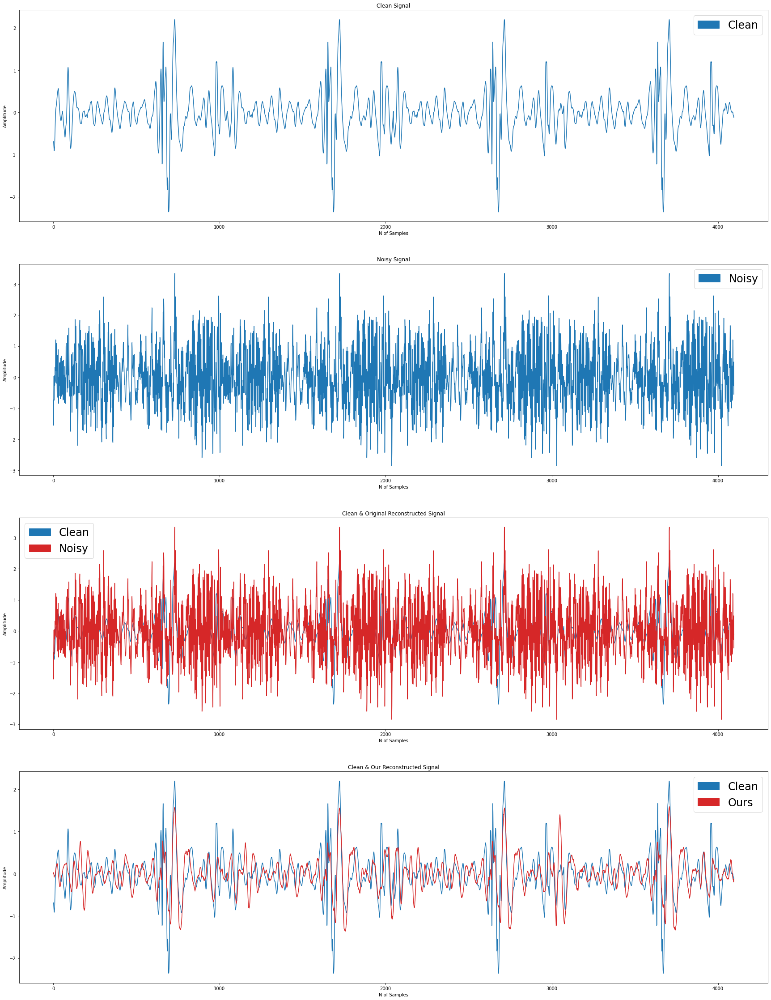

In [67]:
sample = dd_test
s_clean = sample['clean'].flatten()[:4096]
s_noisy = sample['noisy'].flatten()[:4096]
output = kouame_model_saved(torch.tensor(s_noisy, dtype=torch.float32).unsqueeze(0).unsqueeze(0).to(device))[0][0].detach().cpu()
plot_report(s_clean, s_noisy, s_noisy, output, lg=['Clean', 'Noisy', 'Noisy', 'Ours'])